# Import libraries and dataset

In [524]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
sns.set()

In [525]:
import warnings #For removing warning messages which is not important
warnings.filterwarnings('ignore')

In [526]:
dataset=pd.read_csv('athlete_events.csv')

# Initial Exploration

In [243]:
#Overall look of Dataframe
dataset.sample(5)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
35827,18411,Laurent Carnol,M,26.0,187.0,82.0,Luxembourg,LUX,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Men's 200 metres Breaststroke,NaN
4445,2537,Habitam Alemu,F,19.0,171.0,52.0,Ethiopia,ETH,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,Athletics Women's 800 metres,NaN
114757,58115,Ebru Kavaklolu,F,22.0,167.0,58.0,Unified Team,EUN,1992 Summer,1992,Summer,Barcelona,Athletics,"Athletics Women's 3,000 metres",NaN
266270,133219,Kevin Curtis Young,M,25.0,194.0,82.0,United States,USA,1992 Summer,1992,Summer,Barcelona,Athletics,Athletics Men's 400 metres Hurdles,Gold
196254,98529,Leonid Maksimovich Rakovshchik,M,25.0,195.0,91.0,Soviet Union,URS,1964 Summer,1964,Summer,Tokyo,Rowing,Rowing Men's Coxed Pairs,NaN


In [255]:
#Insight into the variables and size 
print('Dataset shape: ',dataset.shape,'\n')
dataset.info()

Dataset shape:  (271116, 15) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [381]:
print('N° Unique NOC: ', len(dataset['NOC'].unique()))
print('N° Unique Teams: ', len(dataset['Team'].unique()),'\n')
print('Duplicated ID: ',dataset['ID'].duplicated().sum())
dataset[dataset['ID'].duplicated()].head(6)

N° Unique NOC:  230
N° Unique Teams:  1184 

Duplicated ID:  135545


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
5,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",NaN
6,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,NaN
7,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,"Speed Skating Women's 1,000 metres",NaN
8,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,NaN
9,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,"Speed Skating Women's 1,000 metres",NaN
11,6,Per Knut Aaland,M,31.0,188.0,75.0,United States,USA,1992 Winter,1992,Winter,Albertville,Cross Country Skiing,Cross Country Skiing Men's 50 kilometres,NaN


N° of entries with NaN values for Height : 60171
N° of entries with NaN values for Weight : 62875
N° of entries with NaN values for Age : 9474
N° of entries with NaN values for either Weight, Height or Age : 64951
N° of entries with all values: 206165


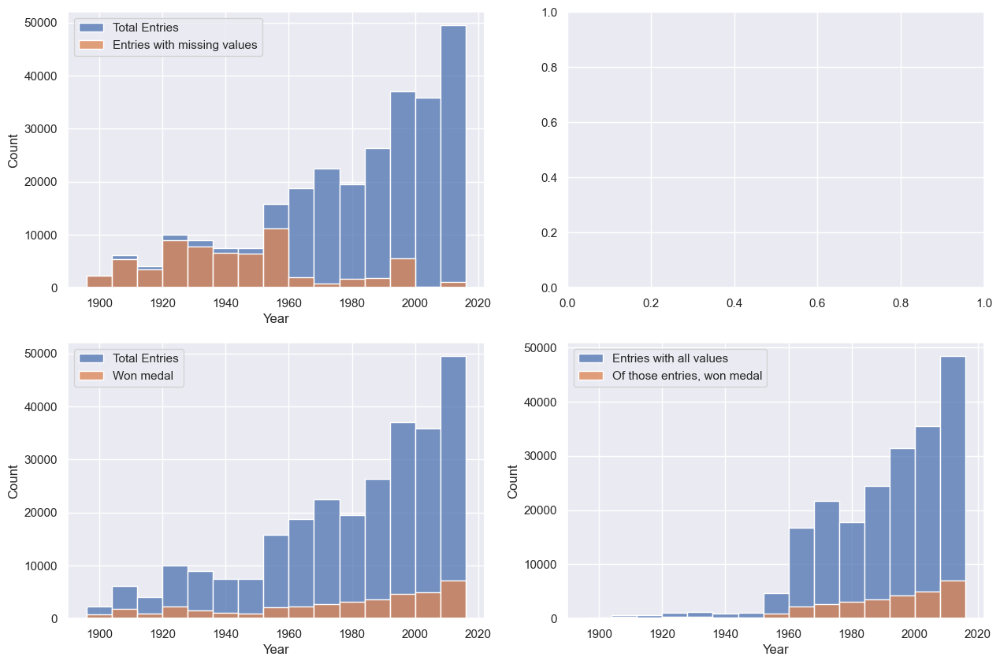

In [283]:
dataset_missing_values= dataset_missing_values=dataset[(dataset['Height'].isnull()) | (dataset['Weight'].isnull()) | (dataset['Age'].isnull())]
dataset_allvalues= dataset[(dataset['Height'].notnull()) & (dataset['Weight'].notnull()) & (dataset['Age'].notnull())]

print('N° of entries with NaN values for Height :',len(dataset[dataset['Height'].isnull()]))
print('N° of entries with NaN values for Weight :',len(dataset[dataset['Weight'].isnull()]))
print('N° of entries with NaN values for Age :',len(dataset[dataset['Age'].isnull()]))
print('N° of entries with NaN values for either Weight, Height or Age :',len(dataset_missing_values))
print('N° of entries with all values:',len(dataset_allvalues))

f,axes=plt.subplots(2,2, figsize=(15,10))

sb.histplot(dataset['Year'], bins=15, label='Total Entries',ax=axes[0,0])
sb.histplot(dataset_missing_values['Year'], bins=15, label='Entries with missing values', ax=axes[0,0])

sb.histplot(dataset['Year'],bins=15, ax=axes[1,0], label='Total Entries' )
sb.histplot(dataset['Year'][dataset["Medal"].notnull()],bins=15, ax=axes[1,0] , label='Won medal')

sb.histplot(dataset_allvalues['Year'],bins=15, ax=axes[1,1], label='Entries with all values' )
sb.histplot(dataset_allvalues['Year'][dataset_allvalues["Medal"].notnull()],bins=15, ax=axes[1,1] , label='Of those entries, won medal')

axes[0,0].legend()
axes[1,0].legend()
axes[1,1].legend()


# Cleaning Dataset

In [527]:
#Clean dataset before Exploratory Analysis
clean_df=dataset.copy()
clean_df.set_index('ID', inplace=True) #Reset Index to ID
clean_df.columns = clean_df.columns.str.upper() #Capitalise all column labels
clean_df.drop(labels= ['GAMES','SEASON','CITY'], axis='columns', inplace=True) #Drop unnecessary cloumns
clean_df["MEDAL"].fillna(value = "NoMedal", inplace = True) #Fill Nan values in Medal variable
clean_df= clean_df[(clean_df['HEIGHT'].notnull()) & (clean_df['WEIGHT'].notnull()) & (clean_df['AGE'].notnull())] #Remove entries with missing data
#Check
clean_df.info()
clean_df.sample(5)

<class 'pandas.core.frame.DataFrame'>
Index: 206165 entries, 1 to 135571
Data columns (total 11 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   NAME    206165 non-null  object 
 1   SEX     206165 non-null  object 
 2   AGE     206165 non-null  float64
 3   HEIGHT  206165 non-null  float64
 4   WEIGHT  206165 non-null  float64
 5   TEAM    206165 non-null  object 
 6   NOC     206165 non-null  object 
 7   YEAR    206165 non-null  int64  
 8   SPORT   206165 non-null  object 
 9   EVENT   206165 non-null  object 
 10  MEDAL   206165 non-null  object 
dtypes: float64(3), int64(1), object(7)
memory usage: 18.9+ MB


,NAME,SEX,AGE,HEIGHT,WEIGHT,TEAM,NOC,YEAR,SPORT,EVENT,MEDAL
ID,,,,,,,,,,,
30367,Richard Ducroz,M,26.0,174.0,71.0,France,FRA,2010,Curling,Curling Men's Curling,NoMedal
90846,Glenn Ivor Palmer,M,19.0,180.0,72.0,Great Britain,GBR,1964,Canoeing,"Canoeing Men's Kayak Fours, 1,000 metres",NoMedal
99219,Jean-Laurent Ravera,M,24.0,184.0,69.0,Monaco,MON,2004,Swimming,Swimming Men's 100 metres Freestyle,NoMedal
55618,Barbara Pearl Jones (-Slater),F,23.0,171.0,60.0,United States,USA,1960,Athletics,Athletics Women's 100 metres,NoMedal
47301,Lothar Heinrich,M,47.0,176.0,75.0,Austria,AUT,1988,Shooting,"Shooting Men's Small-Bore Rifle, Three Positio...",NoMedal


# Exploratory Analysis

N° Unique NOC:  226


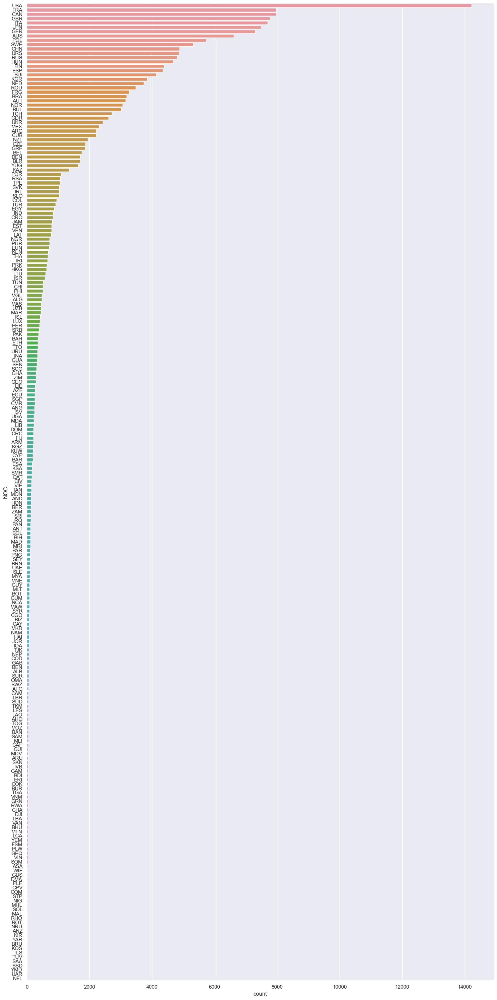

In [404]:
#Categorical Plot of contestants per country
print('N° Unique NOC: ', len(clean_df['NOC'].unique()))

sb.catplot(data= clean_df, y='NOC',kind='count', height=30, aspect=0.5, order=dataset_allvalues["NOC"].value_counts().index)

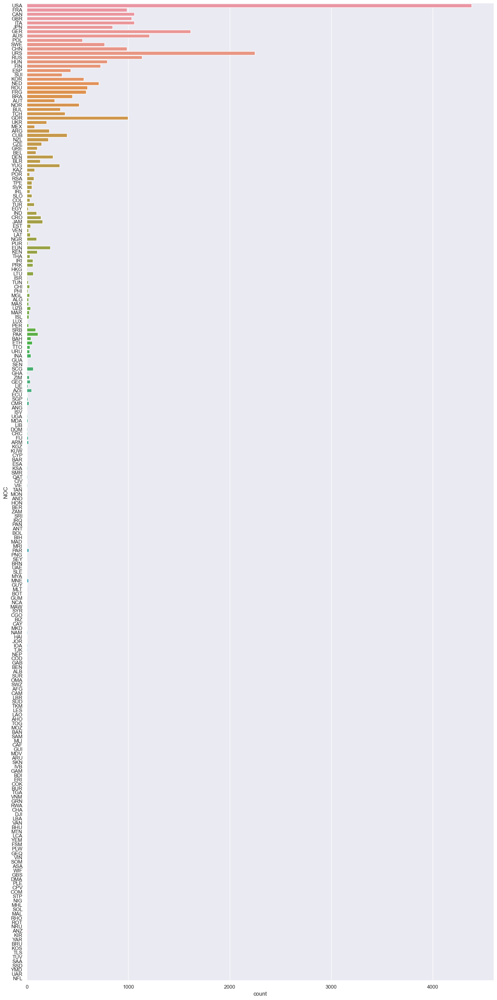

In [704]:
#Categorical Plot of contestants that have won a medal per country (ordered based on n° of tot contestants per NOC)
df_medal= clean_df[clean_df['MEDAL']!='NoMedal']
sb.catplot(data= df_medal, y='NOC',kind='count', height=30, aspect=0.5, order=clean_df["NOC"].value_counts().index)
plt.savefig('cont_percuntry')

N° Unique Sports:  66
N° Unique Sports with more than 0 entries (after data cleansing):  56


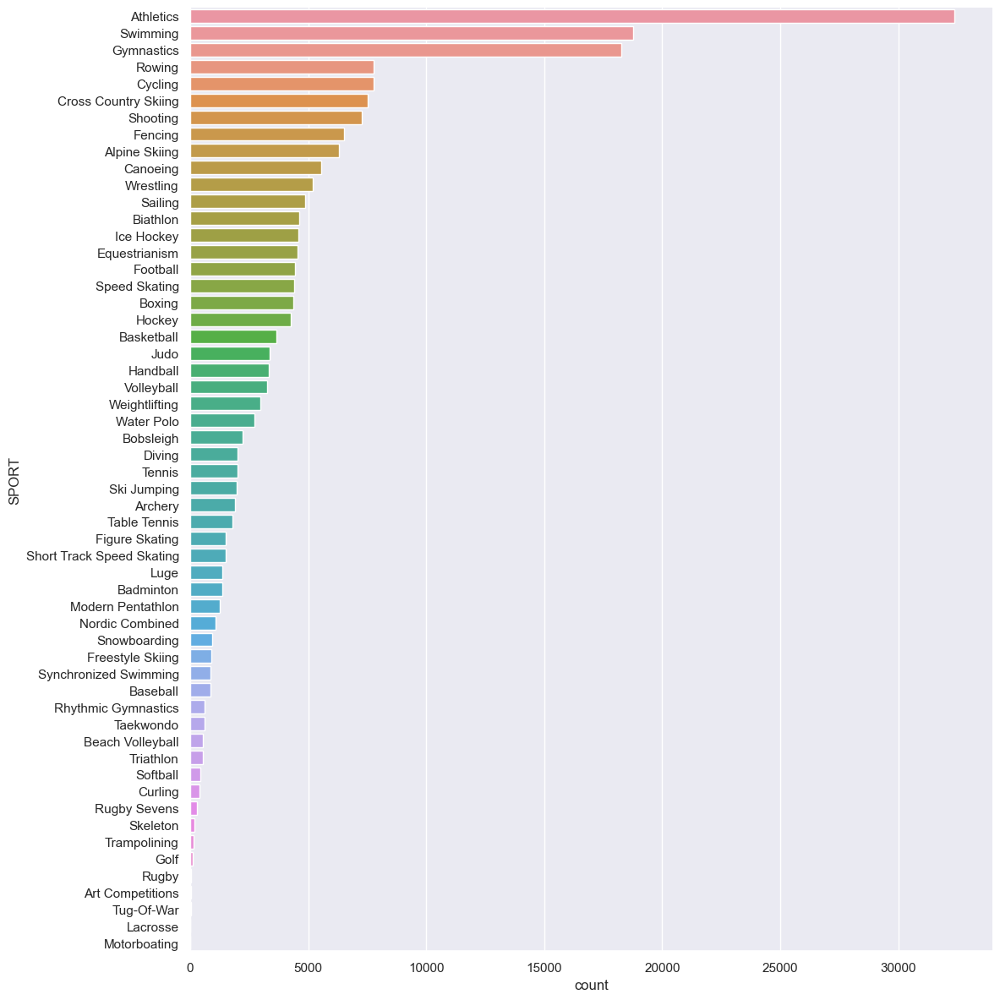

In [407]:
#Categorical plot of contestants per sport
print('N° Unique Sports: ', len(dataset['Sport'].unique()))
print('N° Unique Sports with more than 0 entries (after data cleansing): ', len(clean_df['SPORT'].value_counts()))
sb.catplot(data=clean_df, y='SPORT', kind='count', height=12,  order=clean_df["SPORT"].value_counts().index)

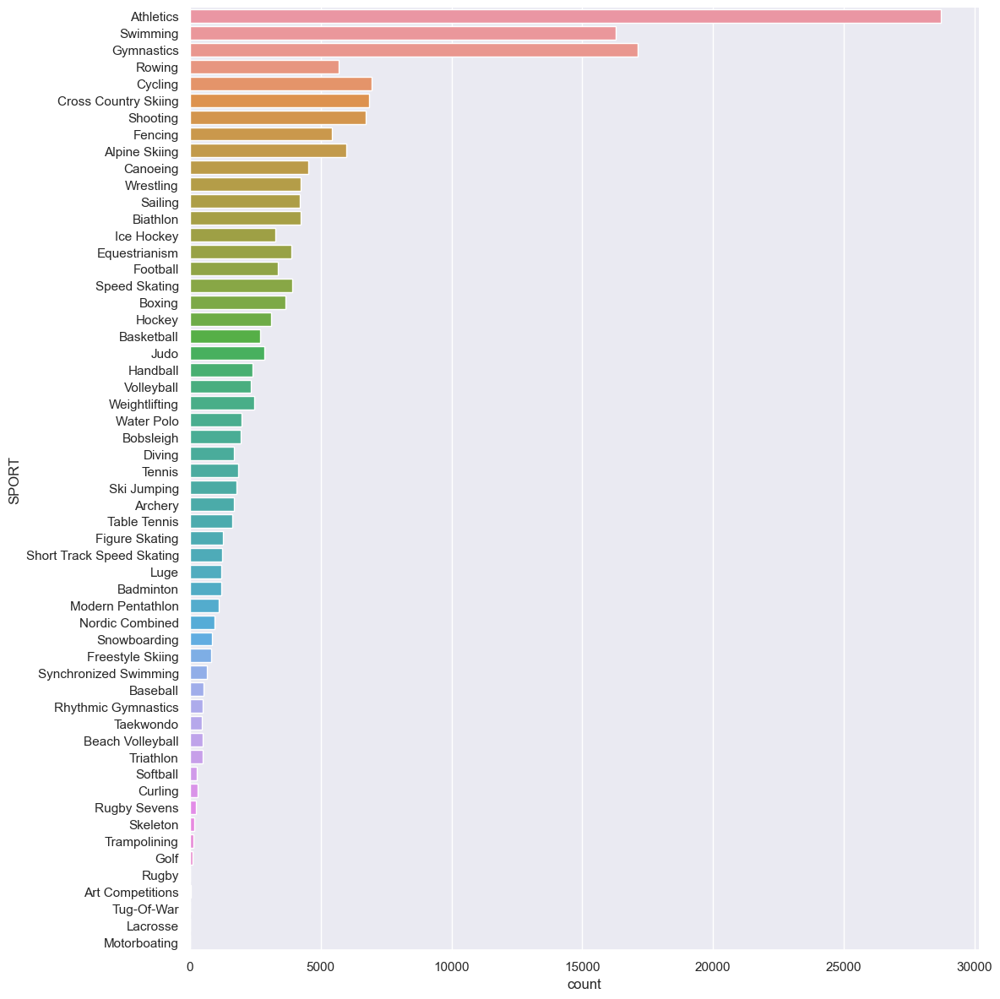

In [408]:
#Categorical plot of contestants with medal per sport
sb.catplot(data=df_medal, y='SPORT', kind='count', height=12,  order=clean_df["SPORT"].value_counts().index)

<Axes: xlabel='SPORT', ylabel='NOC'>

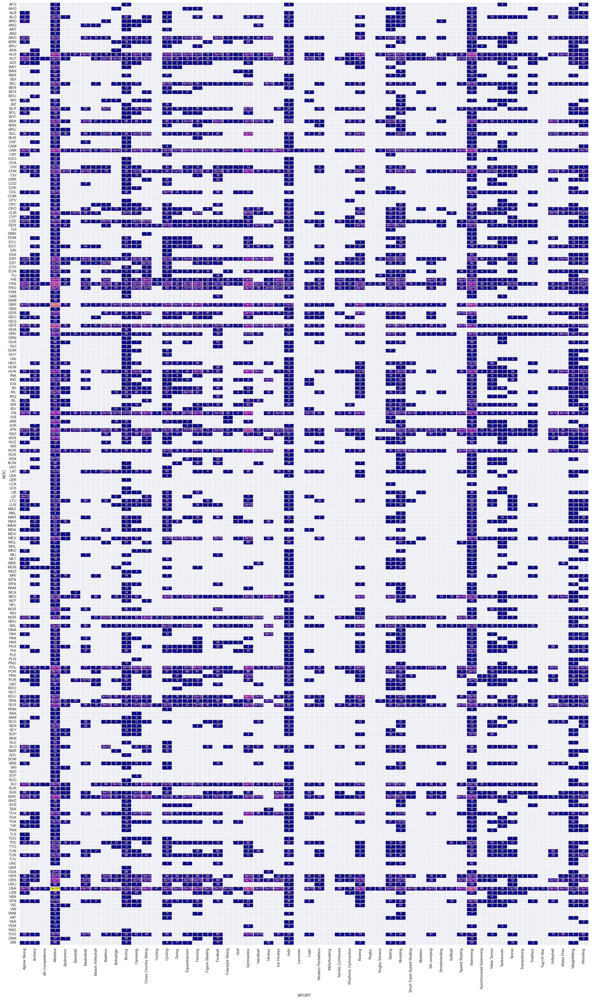

In [450]:
#Heatmap of NationalityOfContestant and Sport to see most popular sport per country
f = plt.figure(figsize=(30, 50))
sort_bysport = clean_df['SPORT'].value_counts().index


sb.heatmap(clean_df.groupby(['NOC','SPORT']).size().unstack(),cmap = "plasma",  cbar=False,
          linewidth=0.1, annot = True, annot_kws = {"size": 10})


<Axes: xlabel='SPORT', ylabel='NOC'>

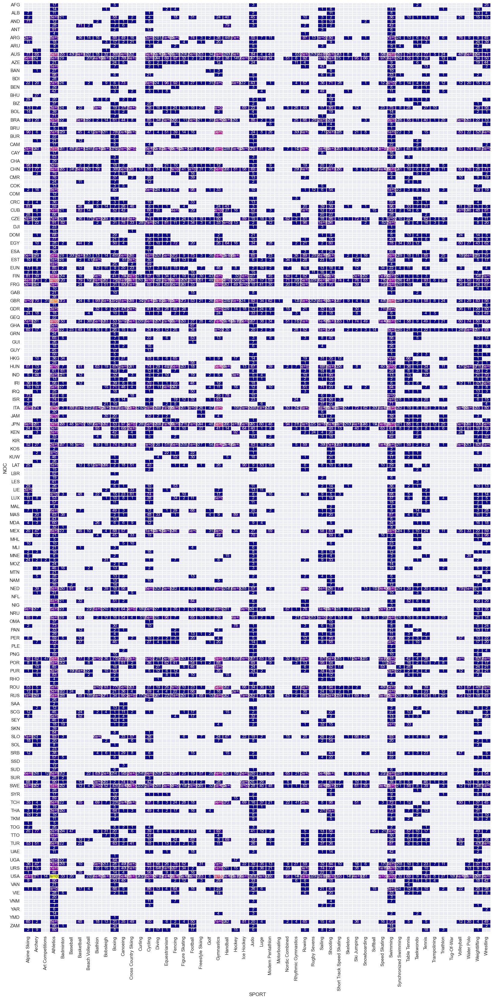

In [410]:
#Heatmap of NationalityOfContestant and Sport to see medals won in each sport per country
f = plt.figure(figsize=(20, 40))
sb.heatmap(df_medal.groupby(['NOC','SPORT']).size().unstack(),cmap = "plasma",  cbar=False,
           linewidth=0.1, annot = True, annot_kws = {"size": 10})

In [ ]:
#Axes don't work with catplots
f, axes= plt.subplots(28, 2, figsize=(20, 30))

count=0
for each_sport in dataset_allvalues['Sport'].unique():
    each_sport_df= dataset_allvalues[dataset_allvalues['Sport']==each_sport]
    if count%2==0:  
        sb.catplot(data=each_sport_df, y='Event', kind='count', order=each_sport_df["Event"].value_counts().index, ax=axes[int(count-(count/2)),0])
    else:
        sb.catplot(data=each_sport_df, y='Event', kind='count', order=each_sport_df["Event"].value_counts().index, ax=axes[int((count-1)/2),1])     
    count+=1

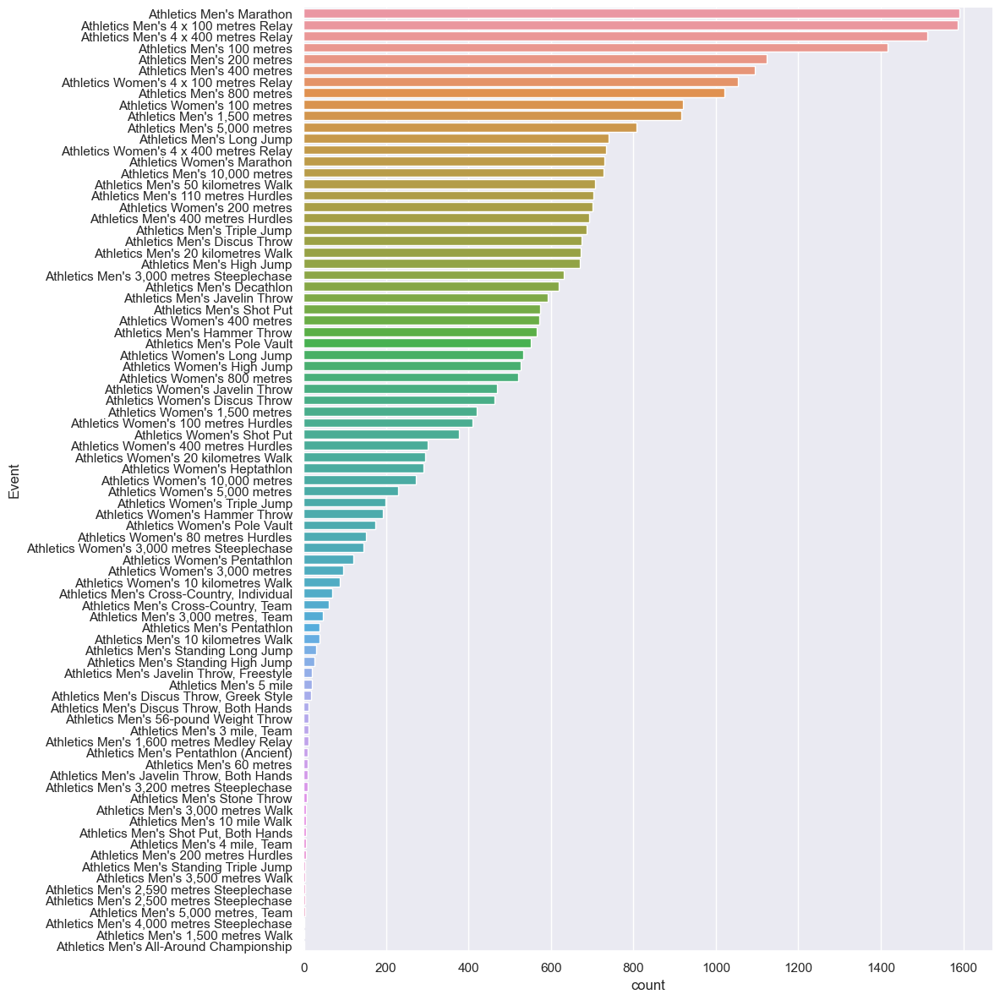

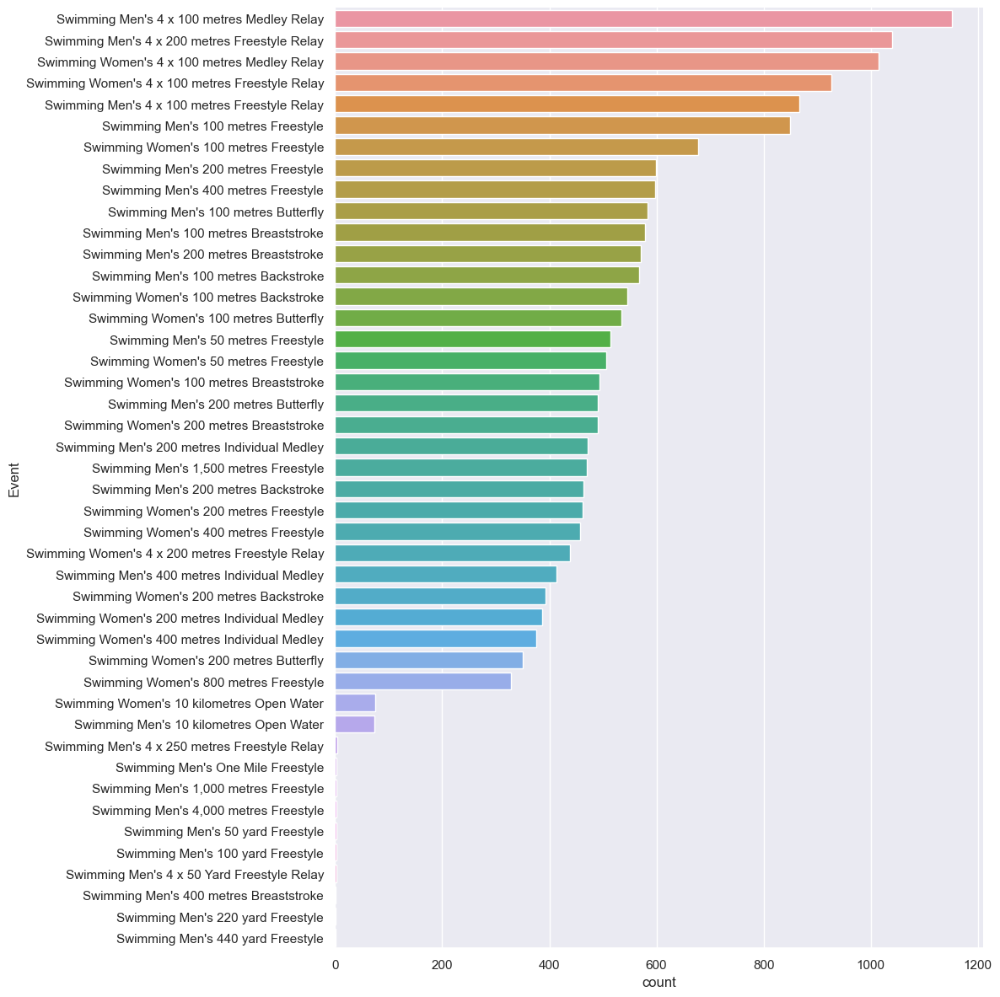

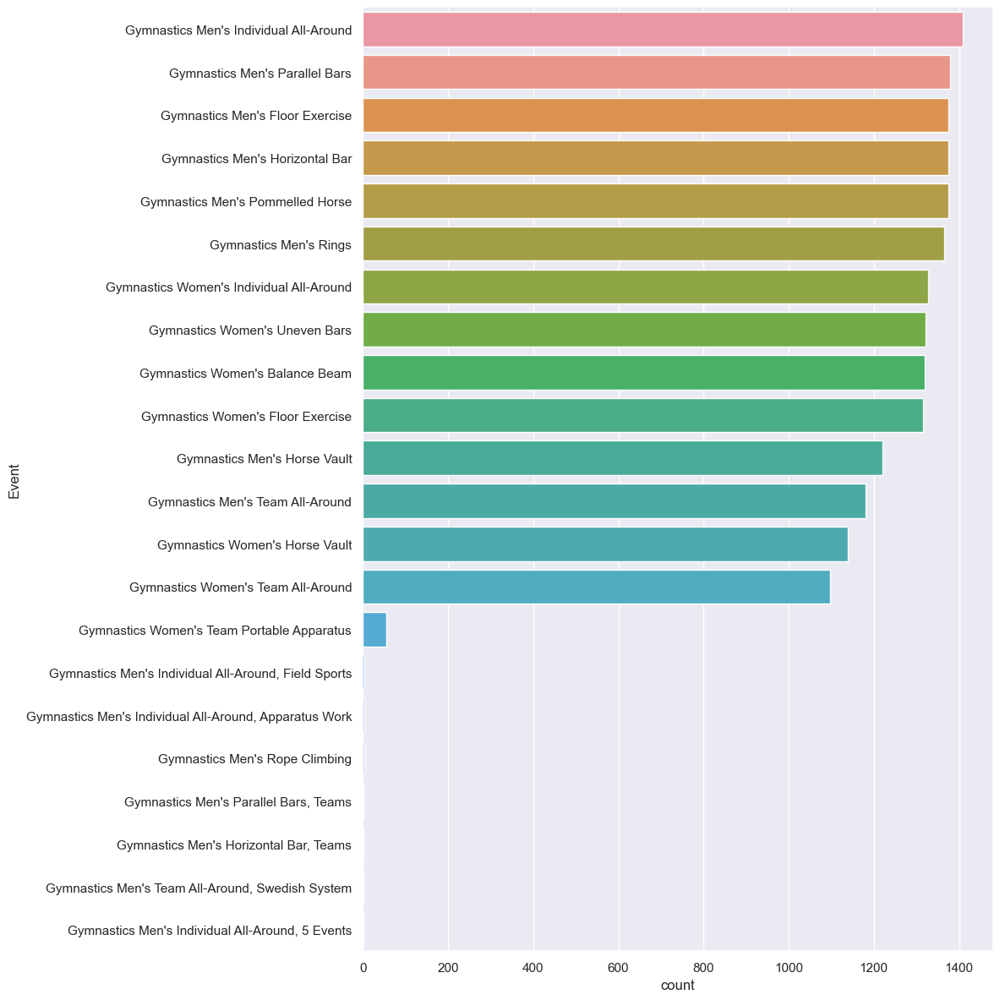

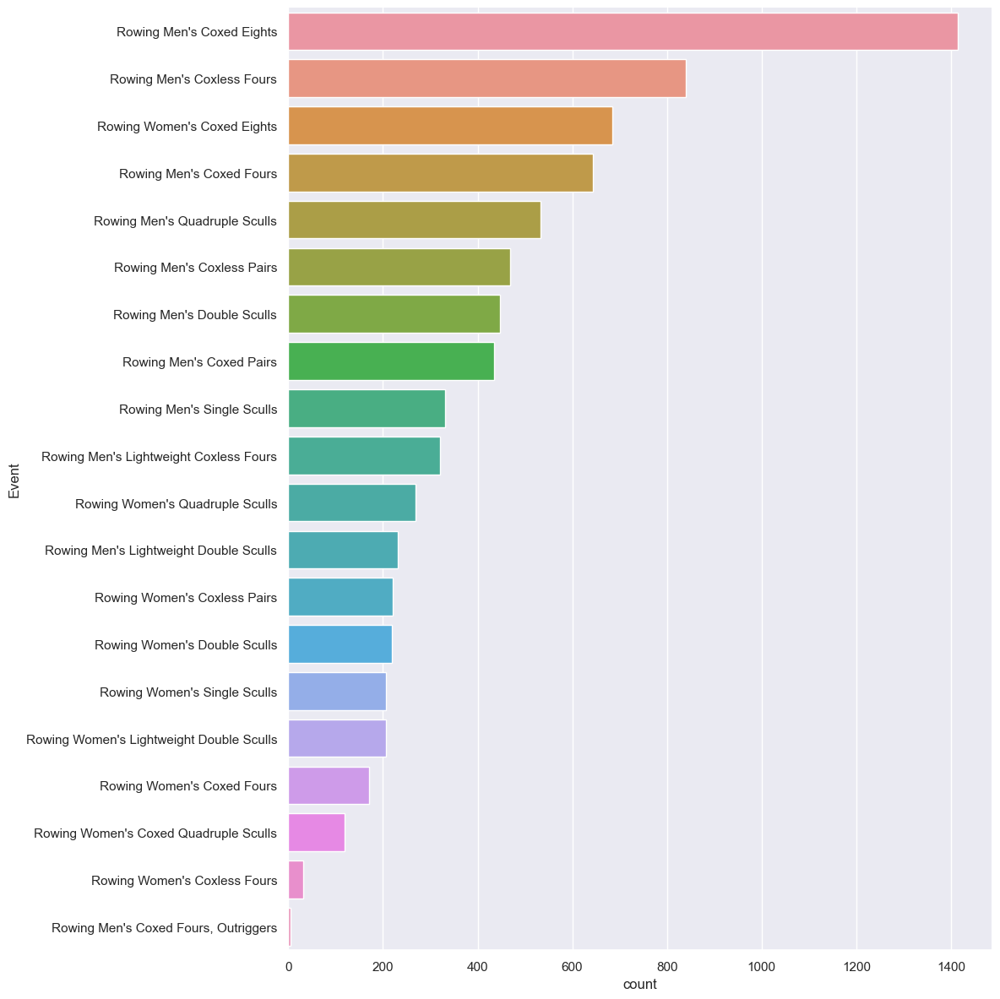

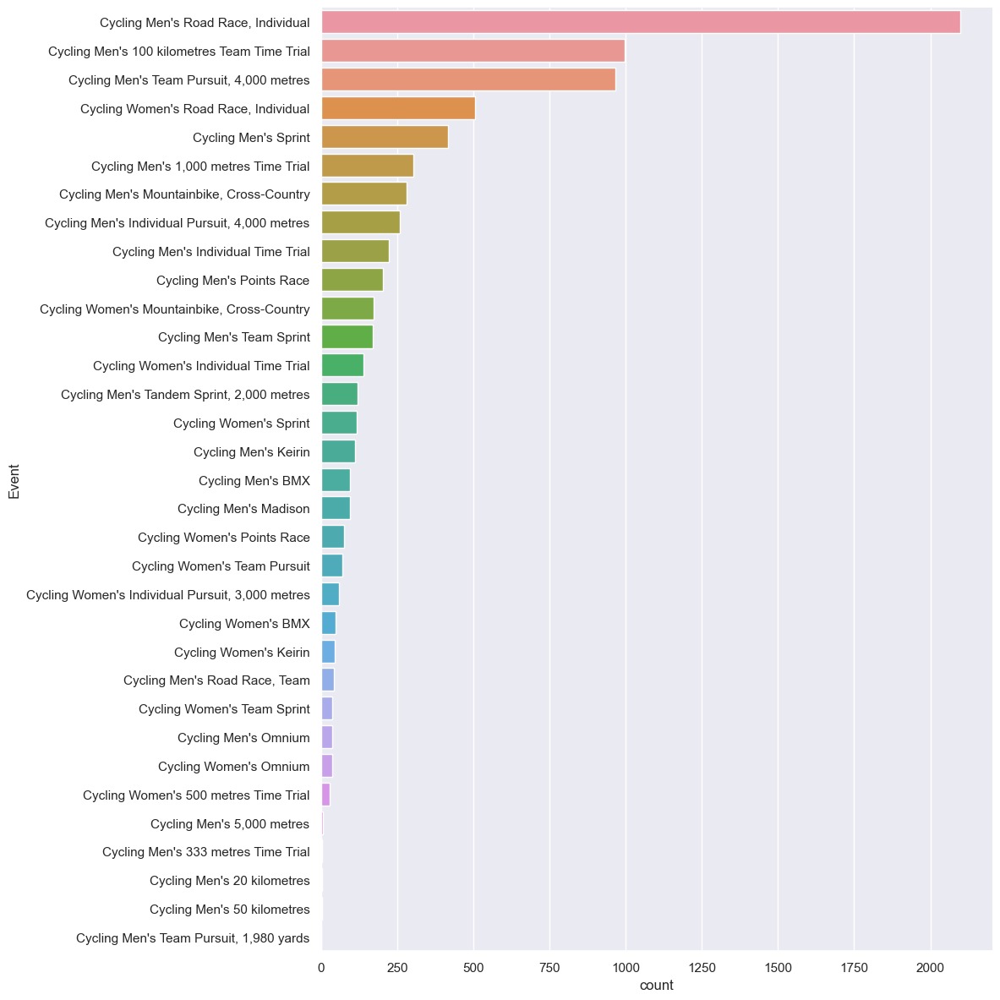

...

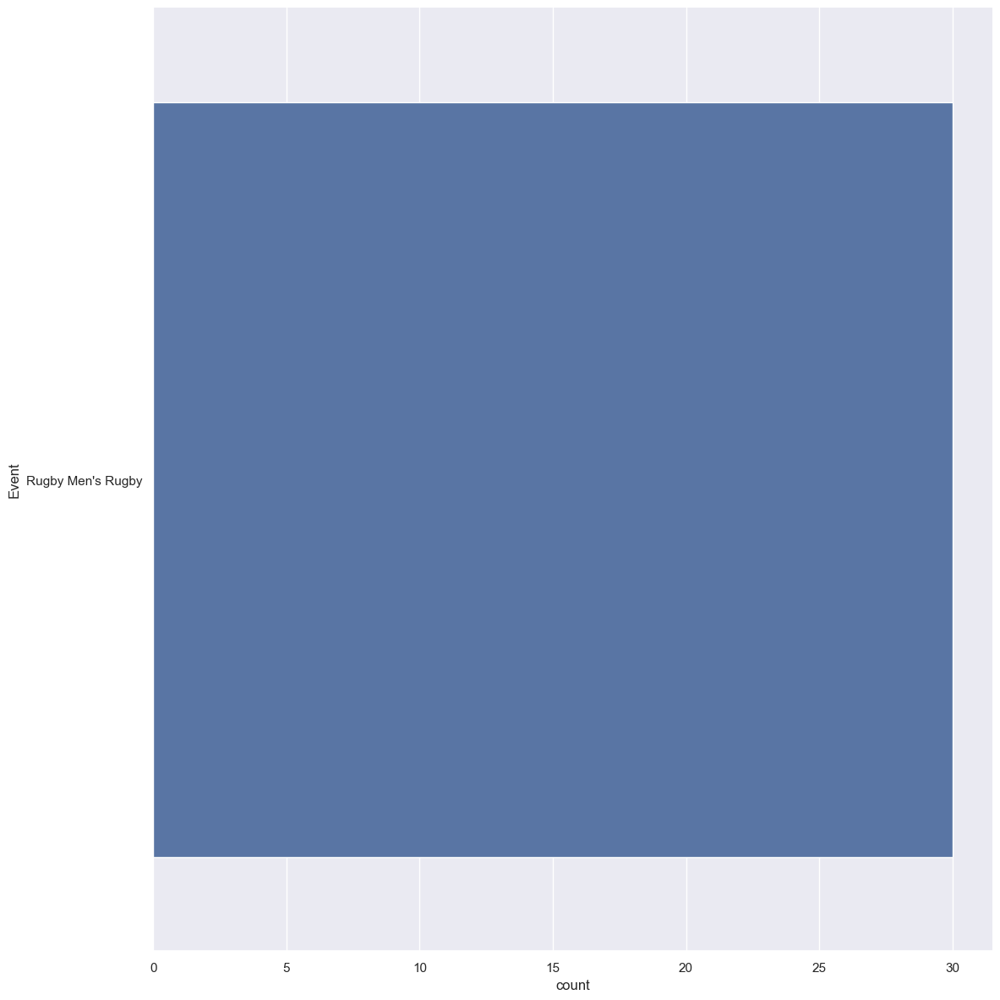

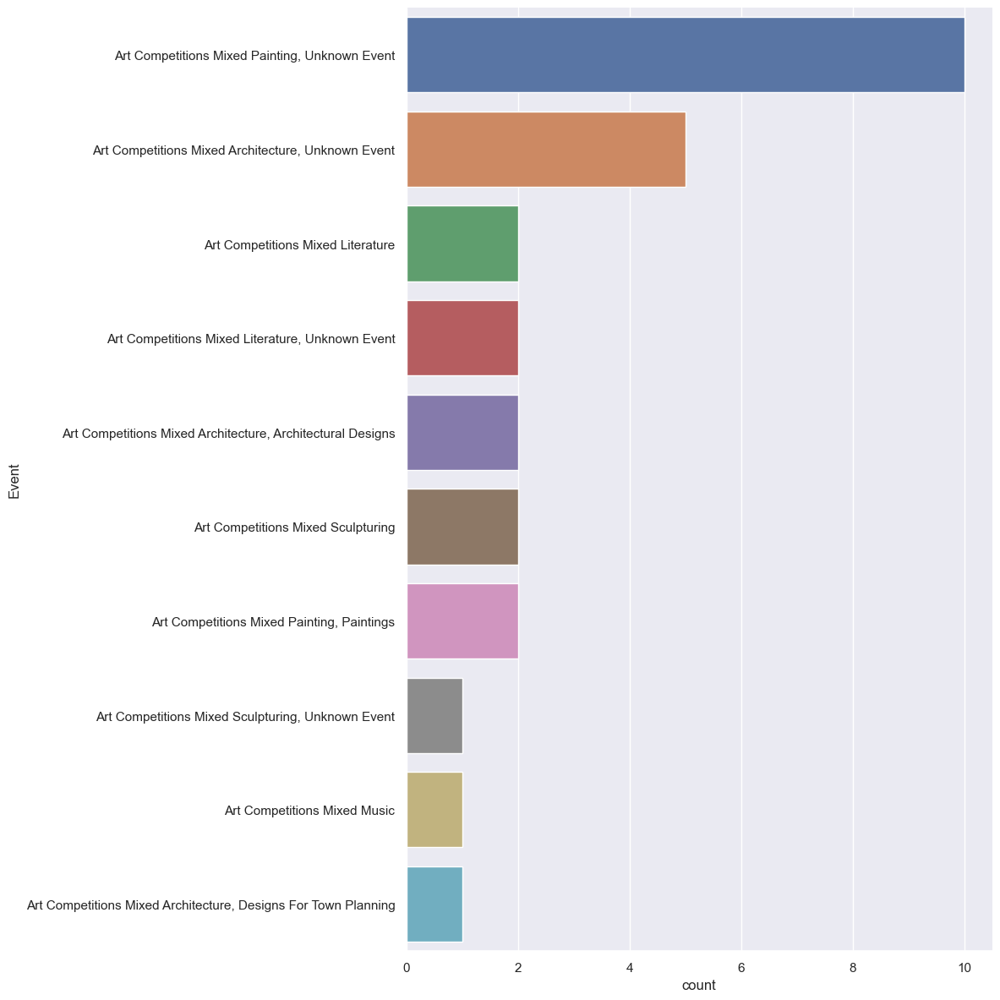

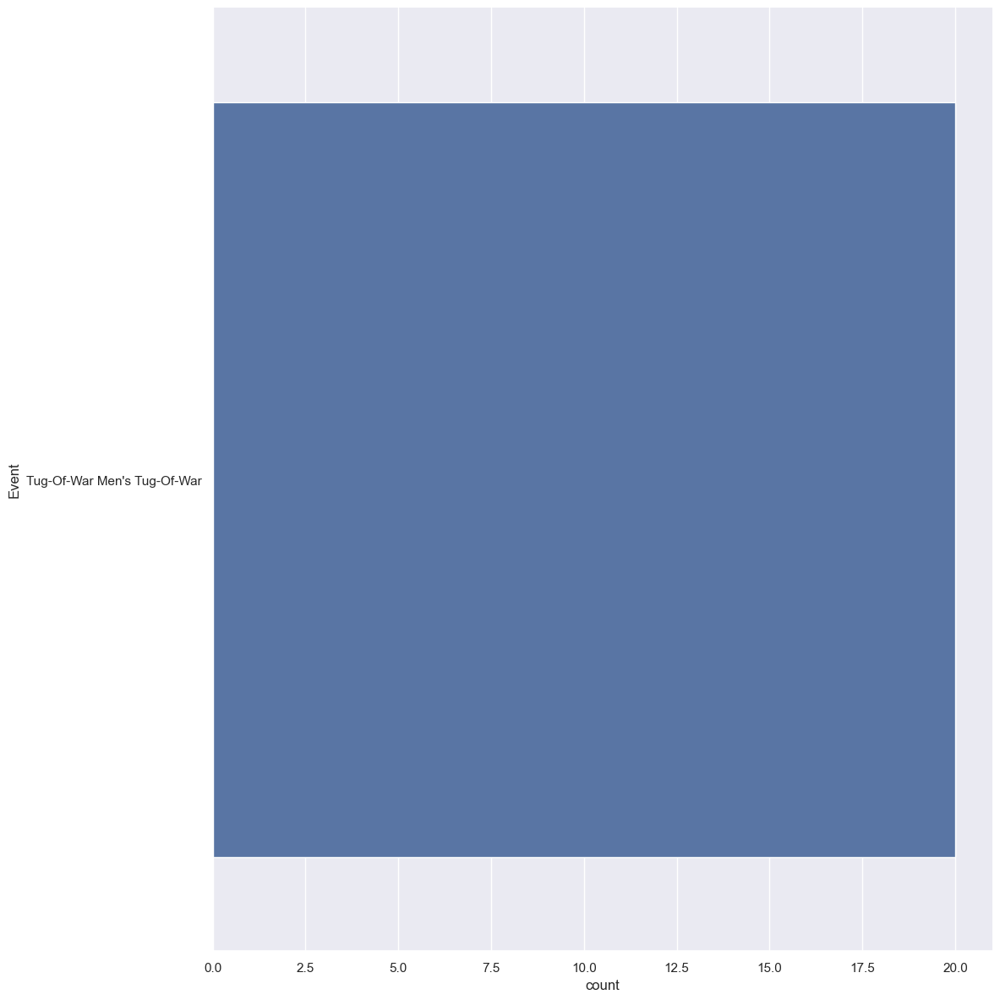

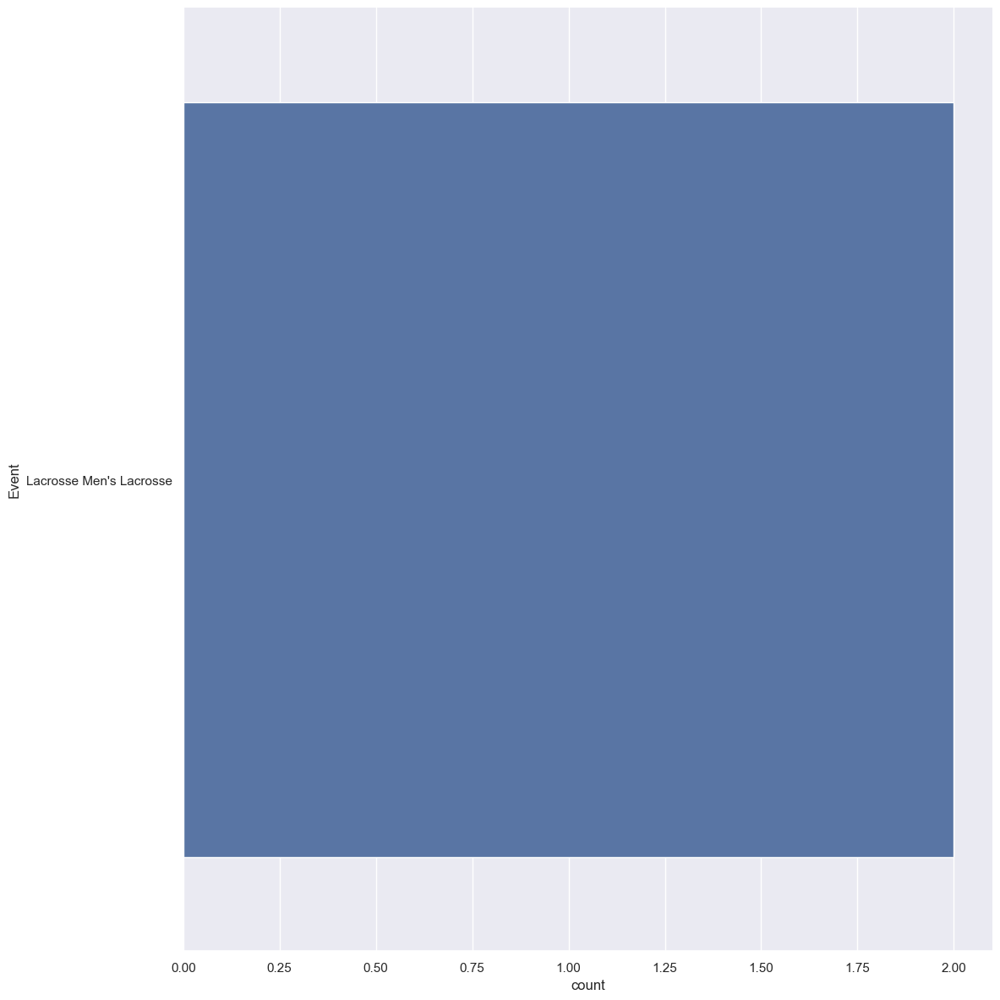

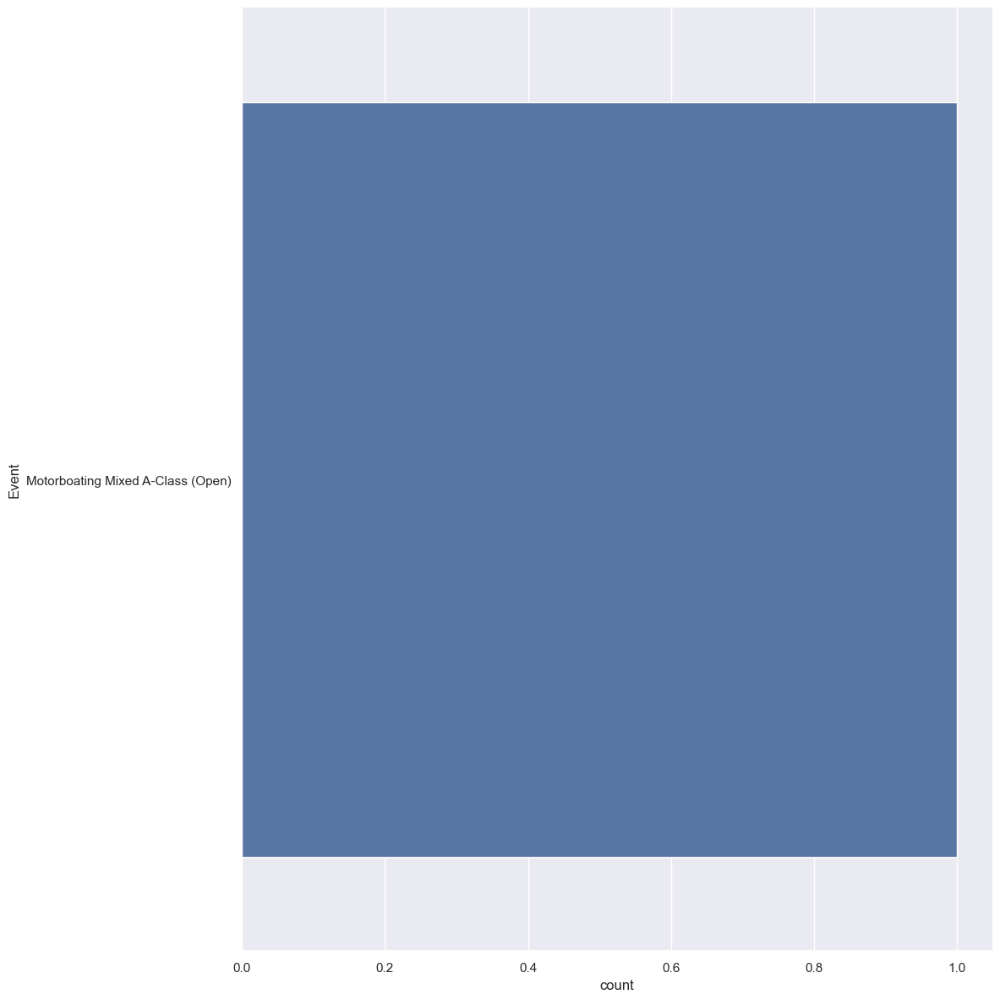

In [357]:
#Looking at competitors in each event for each sport
for each_sport in dataset_allvalues['Sport'].value_counts().index.unique():
    each_sport_df= dataset_allvalues[dataset_allvalues['Sport']==each_sport]
    sb.catplot(data=each_sport_df, y='Event', kind='count', height=12, order=each_sport_df["Event"].value_counts().index)
    

# Stats

In [478]:
#All athletes
df_numeric= clean_df[['AGE','HEIGHT','WEIGHT']]
print(df_numeric.describe())

#Athletes with medal
df_num_medal= df_medal[['AGE','HEIGHT','WEIGHT']]
print(df_num_medal.describe())


#Top 6 athletes 
print(df_medal.index.value_counts().head(6))
top6_ath = df_medal.loc[[115354,76437,106296,120051,129196,21462]]
df_num_top6 = top6_ath[['AGE','HEIGHT','WEIGHT']]
print(df_num_top6.describe())


                 AGE         HEIGHT         WEIGHT
count  206165.000000  206165.000000  206165.000000
mean       25.055509     175.371950      70.688337
std         5.483096      10.546088      14.340338
min        11.000000     127.000000      25.000000
25%        21.000000     168.000000      60.000000
50%        24.000000     175.000000      70.000000
75%        28.000000     183.000000      79.000000
max        71.000000     226.000000     214.000000
                 AGE         HEIGHT         WEIGHT
count  175984.000000  175984.000000  175984.000000
mean       24.991454     174.982578      70.162657
std         5.551519      10.430378      14.156761
min        11.000000     127.000000      25.000000
25%        21.000000     168.000000      60.000000
50%        24.000000     175.000000      69.000000
75%        28.000000     182.000000      78.000000
max        71.000000     226.000000     214.000000
ID
115354    38
76437     31
106296    30
120051    28
129196    27
21462     27
N

Text(0.5, 1.0, 'Out of all Sport')

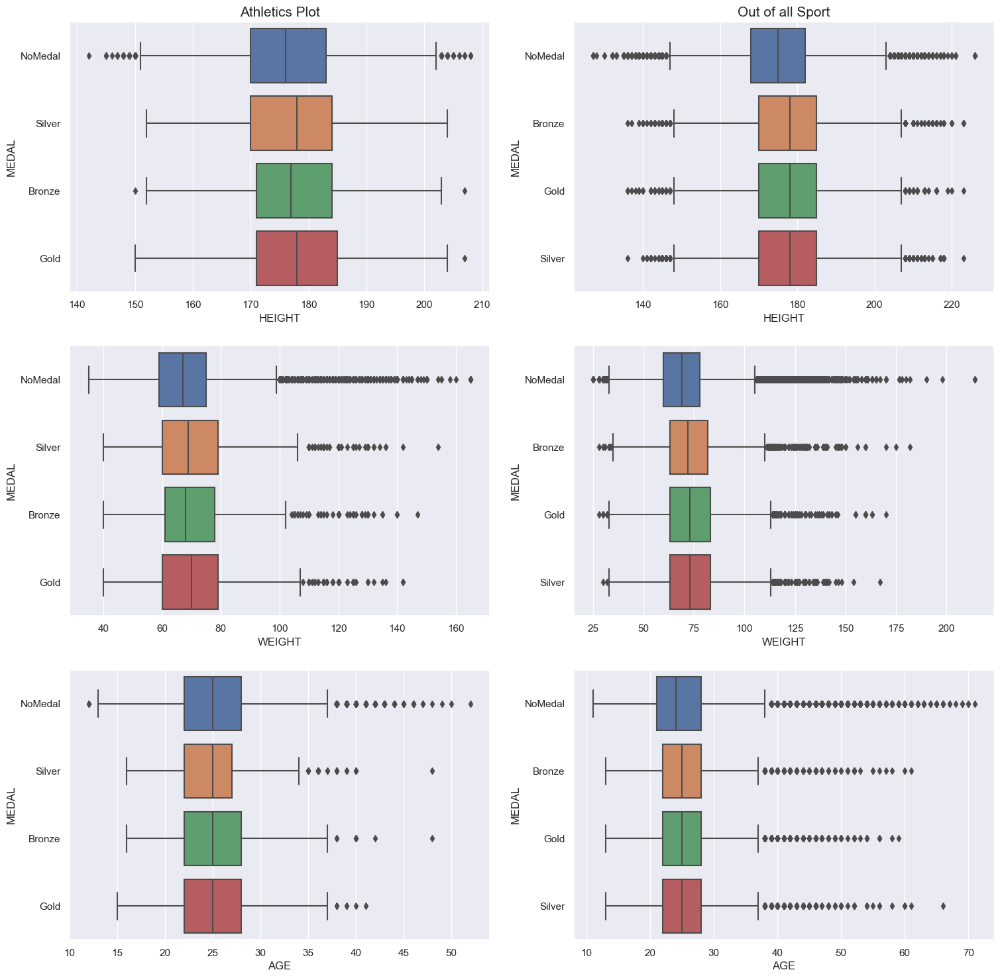

In [569]:
f,axes=plt.subplots(3,2, figsize=(18,18))
df_athletics=clean_df[clean_df['SPORT']=='Athletics']

sb.boxplot(x = "HEIGHT", y = "MEDAL", data = df_athletics, orient = "h", ax=axes[0,0])
sb.boxplot(x = "HEIGHT", y = "MEDAL", data = clean_df, orient = "h", ax=axes[0,1])

sb.boxplot(x = "WEIGHT", y = "MEDAL", data = df_athletics, orient = "h", ax=axes[1,0])
sb.boxplot(x = "WEIGHT", y = "MEDAL", data = clean_df, orient = "h", ax=axes[1,1])

sb.boxplot(x = "AGE", y = "MEDAL", data = df_athletics, orient = "h", ax=axes[2,0])
sb.boxplot(x = "AGE", y = "MEDAL", data = clean_df, orient = "h", ax=axes[2,1])

axes[0,0].set_title('Athletics Plot', fontsize=15)
axes[0,1].set_title('Out of all Sports', fontsize=15)


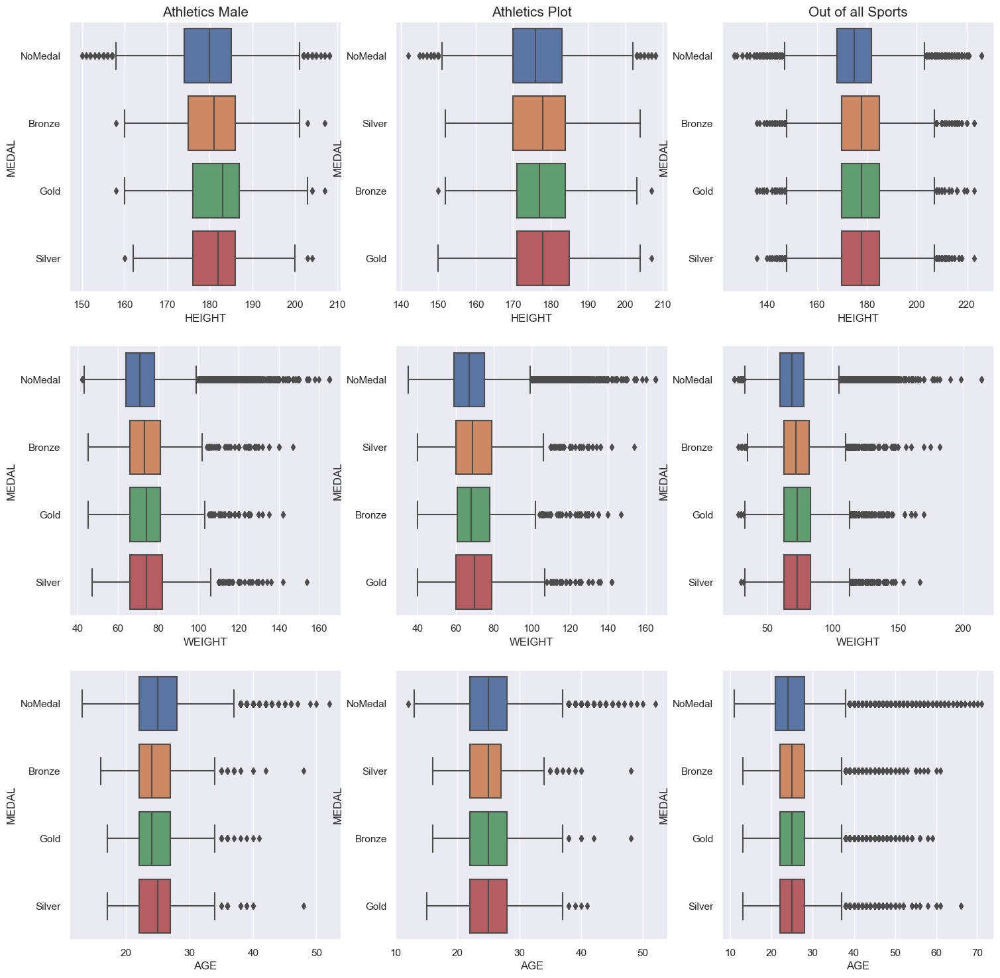

In [705]:
f,axes=plt.subplots(3,3, figsize=(18,18))
df_athletics=clean_df[clean_df['SPORT']=='Athletics']
df_athletics_male= df_athletics[df_athletics['SEX']=='M']

sb.boxplot(x = "HEIGHT", y = "MEDAL", data = df_athletics_male, orient = "h", ax=axes[0,0])
sb.boxplot(x = "HEIGHT", y = "MEDAL", data = df_athletics, orient = "h", ax=axes[0,1])
sb.boxplot(x = "HEIGHT", y = "MEDAL", data = clean_df, orient = "h", ax=axes[0,2])

sb.boxplot(x = "WEIGHT", y = "MEDAL", data = df_athletics_male, orient = "h", ax=axes[1,0])
sb.boxplot(x = "WEIGHT", y = "MEDAL", data = df_athletics, orient = "h", ax=axes[1,1])
sb.boxplot(x = "WEIGHT", y = "MEDAL", data = clean_df, orient = "h", ax=axes[1,2])

sb.boxplot(x = "AGE", y = "MEDAL", data = df_athletics_male, orient = "h", ax=axes[2,0])
sb.boxplot(x = "AGE", y = "MEDAL", data = df_athletics, orient = "h", ax=axes[2,1])
sb.boxplot(x = "AGE", y = "MEDAL", data = clean_df, orient = "h", ax=axes[2,2])

axes[0,0].set_title('Athletics Male', fontsize=15)
axes[0,1].set_title('Athletics Plot', fontsize=15)
axes[0,2].set_title('Out of all Sports', fontsize=15)
plt.savefig('boxplot')

<Axes: >

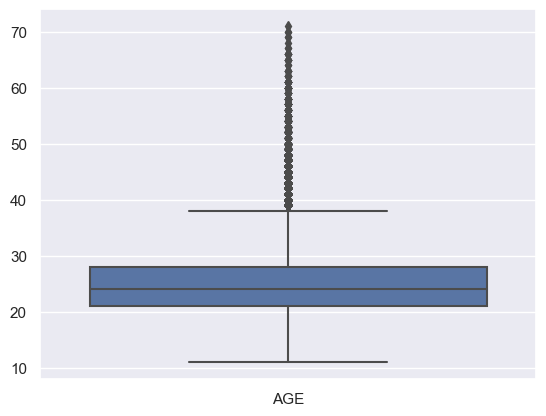

In [508]:
sb.boxplot(pd.DataFrame(df_numeric['AGE']))

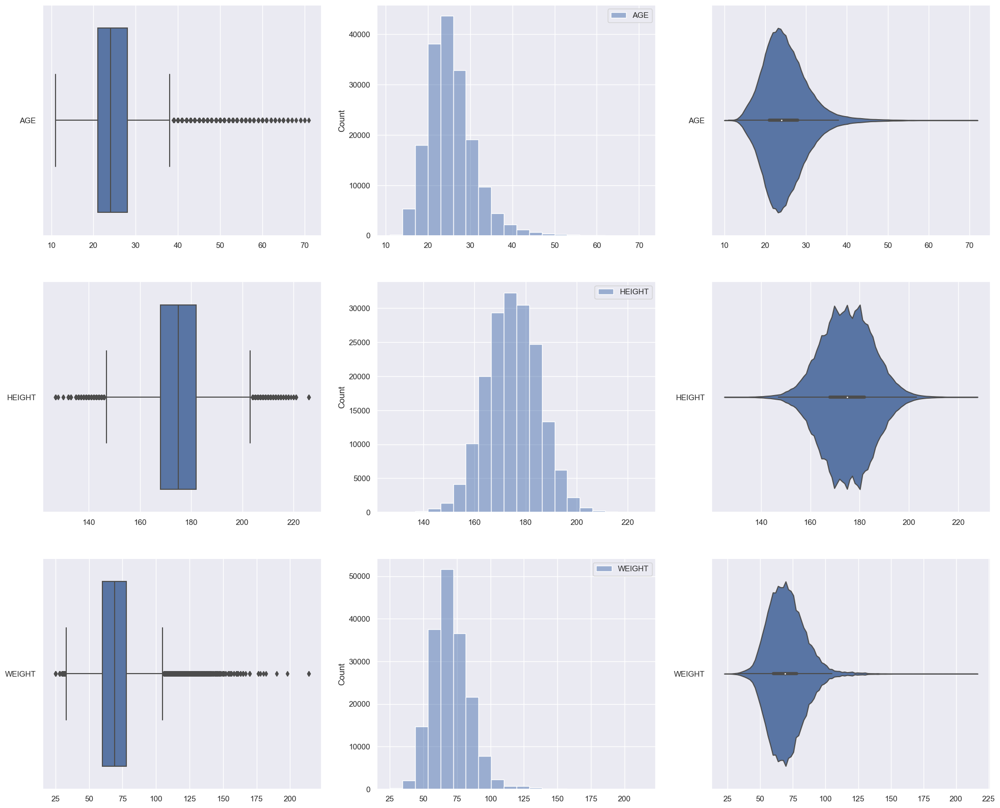

In [523]:
f, axes = plt.subplots(3, 3, figsize=(24, 20))

count=0
for var in df_numeric:
    sb.boxplot(data = pd.DataFrame(df_num_medal[var]), orient = "h", ax = axes[count,0])
    sb.histplot(data = pd.DataFrame(df_num_medal[var]), ax = axes[count,1], bins=20)
    sb.violinplot(data = pd.DataFrame(df_num_medal[var]), orient = "h", ax = axes[count,2])
    #sb.boxplot(data = pd.DataFrame(df_numeric[var]), orient = "h", ax = axes[count,0], color='red', boxprops={'alpha': 0.5})
    #sb.histplot(data = pd.DataFrame(df_numeric[var]), ax = axes[count,1], bins=20, color='red', alpha= 0.5)
    #sb.violinplot(data = pd.DataFrame(df_numeric[var]),orient = "h", ax = axes[count,2], color='red', boxprops={'alpha': 0.5})
    count+=1

<Axes: xlabel='AGE', ylabel='WEIGHT'>

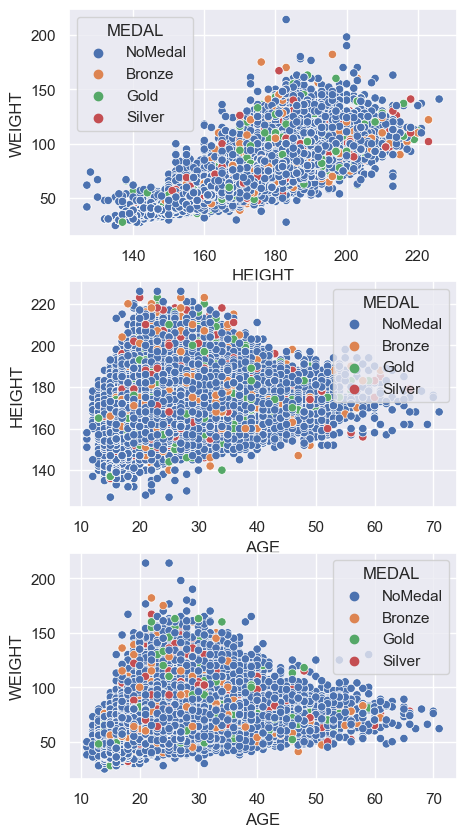

In [567]:
f, axes = plt.subplots(3, 1, figsize=(5, 10))
sb.scatterplot(x='HEIGHT',y='WEIGHT', data=clean_df, hue='MEDAL', ax=axes[0])
sb.scatterplot(x='AGE',y='HEIGHT', data=clean_df, hue='MEDAL', ax=axes[1])
sb.scatterplot(x='AGE',y='WEIGHT', data=clean_df, hue='MEDAL', ax=axes[2])

In [601]:
df_wonanymedal= clean_df.copy()
df_wonanymedal['MEDAL']= clean_df['MEDAL'].replace(['Gold', 'Silver', 'Bronze'], 'WonMedal')
df_wonanymedal.sample(10)

,NAME,SEX,AGE,HEIGHT,WEIGHT,TEAM,NOC,YEAR,SPORT,EVENT,MEDAL
ID,,,,,,,,,,,
41810,Lalonde Keida Gordon,M,27.0,179.0,83.0,Trinidad and Tobago,TTO,2016,Athletics,Athletics Men's 400 metres,NoMedal
56996,"Wai Leung ""Roger"" Kam",M,26.0,177.0,64.0,Hong Kong,HKG,1976,Fencing,"Fencing Men's Foil, Team",NoMedal
64856,Leonie Kullmann,F,16.0,175.0,62.0,Germany,GER,2016,Swimming,Swimming Women's 4 x 200 metres Freestyle Relay,NoMedal
69923,Pedro Manuel Barata Lima,M,17.0,183.0,77.0,Angola,ANG,1988,Swimming,Swimming Men's 50 metres Freestyle,NoMedal
98814,Pawe Rafa Rada,M,29.0,186.0,72.0,Poland,POL,2008,Rowing,Rowing Men's Lightweight Coxless Fours,WonMedal
96902,Donald Wayne Pretty,M,20.0,192.0,87.0,Canada,CAN,1956,Rowing,Rowing Men's Coxed Eights,WonMedal
116983,Jim Sveny,M,32.0,185.0,69.0,Norway,NOR,2004,Athletics,"Athletics Men's 3,000 metres Steeplechase",NoMedal
35642,Peter Fitzgerald,M,22.0,181.0,75.0,Australia,AUS,1976,Athletics,Athletics Men's 200 metres,NoMedal
3951,Lina Marie Andersson,F,20.0,158.0,58.0,Sweden,SWE,2002,Cross Country Skiing,Cross Country Skiing Women's 5/5 kilometres Pu...,NoMedal


Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8536569591845974

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8542547825074697

Need to minimize false_nagatives_medals /total medal of train:  0.9966044891299555
Need to minimize false_nagatives_medals /total medal of test:  0.9988006396588486


<Axes: >

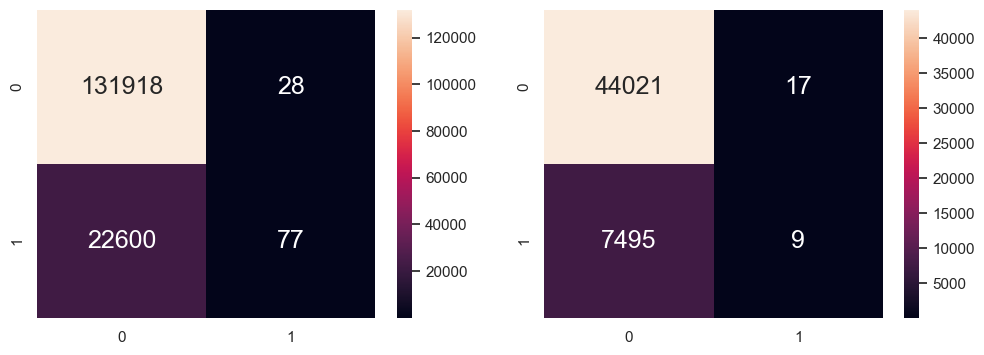

In [659]:
# Import essential models and functions from sklearn

# Extract Response and Predictors
y = pd.DataFrame(df_wonanymedal["MEDAL"]) # Response

df_encod_catdata = pd.get_dummies(df_wonanymedal, columns=[ 'SPORT','SEX']) # Convert categorical variables to numerical using one-hot encoding
X = df_encod_catdata.drop(['NAME','TEAM','EVENT','MEDAL','YEAR','NOC'], axis=1)  # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 5)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict if Won Medal 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

cmatrix_trn=confusion_matrix(y_train, y_train_pred)
false_neg=cmatrix_trn[1,0]/(cmatrix_trn[1,0]+cmatrix_trn[1,1])
print('Need to minimize false_nagatives_medals /total medal of train: ', false_neg)

cmatrix_tst=confusion_matrix(y_test, y_test_pred)
false_neg=cmatrix_tst[1,0]/(cmatrix_tst[1,0]+cmatrix_tst[1,1])
print('Need to minimize false_nagatives_medals /total medal of test: ', false_neg)

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])



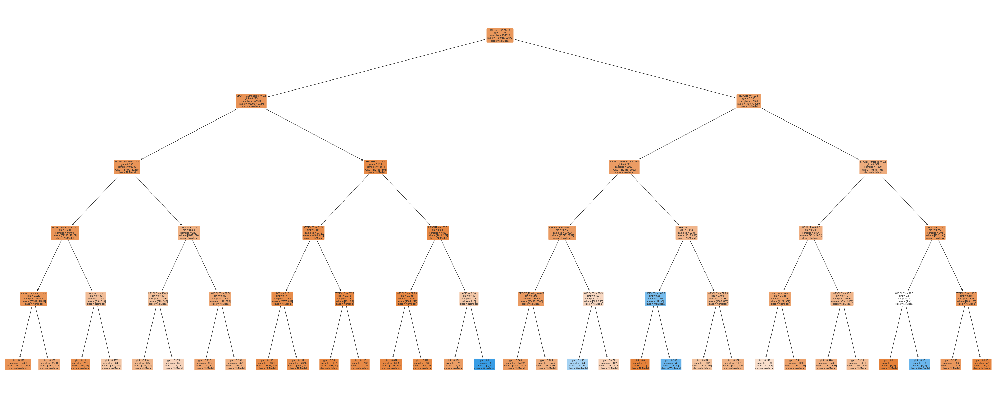

In [660]:
# Plot the trained Decision Tree
from sklearn.tree import plot_tree

f = plt.figure(figsize=(50,20))
plot_tree(dectree, filled=True, rounded=True, feature_names=list(X_train.columns), class_names=["NoMedal",'WonMedal'])
plt.savefig('dectree')

In [626]:
df_wonanymedal= clean_df.copy()
df_wonanymedal['MEDAL']= clean_df['MEDAL'].replace(['Gold', 'Silver', 'Bronze'], 'WonMedal')
df_wonanymedal_athmale= df_wonanymedal[df_wonanymedal['SPORT']=='Swimming']
df_wonanymedal_athmale= df_wonanymedal_athmale[df_wonanymedal_athmale['SEX']=='M']
df_wonanymedal_athmale.sample(10)

,NAME,SEX,AGE,HEIGHT,WEIGHT,TEAM,NOC,YEAR,SPORT,EVENT,MEDAL
ID,,,,,,,,,,,
124068,Juan Carlos Vallejo Arrollo,M,21.0,175.0,70.0,Spain,ESP,1984,Swimming,Swimming Men's 4 x 200 metres Freestyle Relay,NoMedal
41960,"Donald Alexander ""Sandy"" Goss",M,21.0,193.0,89.0,Canada,CAN,1988,Swimming,Swimming Men's 4 x 200 metres Freestyle Relay,NoMedal
14997,Serhiy Petrovych Breus,M,25.0,192.0,80.0,Ukraine,UKR,2008,Swimming,Swimming Men's 100 metres Butterfly,NoMedal
97481,Bence Pulai,M,20.0,193.0,89.0,Hungary,HUN,2012,Swimming,Swimming Men's 4 x 100 metres Medley Relay,NoMedal
120087,Ian James Thorpe,M,17.0,196.0,104.0,Australia,AUS,2000,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,WonMedal
104335,Ahmed Said,M,22.0,176.0,70.0,Egypt,EGY,1984,Swimming,Swimming Men's 100 metres Freestyle,NoMedal
35039,Sergio Andrs Ferreyra,M,31.0,182.0,80.0,Argentina,ARG,2008,Swimming,Swimming Men's 100 metres Breaststroke,NoMedal
91076,Nikolay Ivanovich Pankin,M,23.0,178.0,74.0,Soviet Union,URS,1972,Swimming,Swimming Men's 200 metres Breaststroke,NoMedal
7133,Dmitry Igorevich Balandin,M,21.0,195.0,85.0,Kazakhstan,KAZ,2016,Swimming,Swimming Men's 100 metres Breaststroke,NoMedal


Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9046511627906977

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9046881053855095

Need to minimize false_nagatives_medals /total medal of train:  0.5945945945945946
Need to minimize false_nagatives_medals /total medal of test:  0.5625


<Axes: >

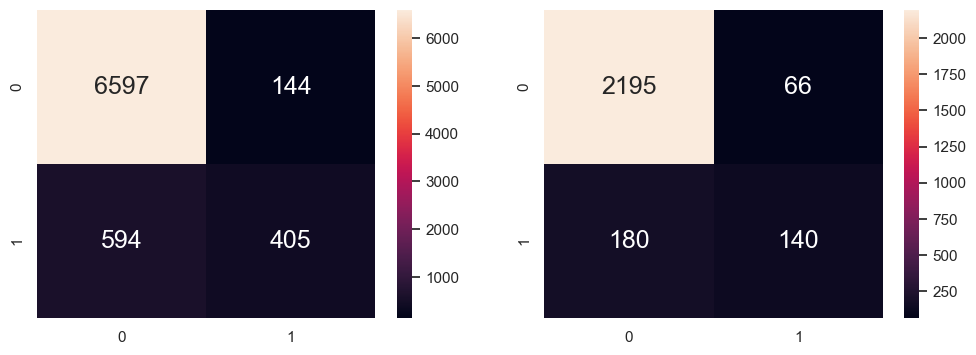

In [663]:
# Extract Response and Predictors
y = pd.DataFrame(df_wonanymedal_athmale["MEDAL"]) # Response

df_encod_catdata = pd.get_dummies(df_wonanymedal_athmale, columns=['NOC']) # Convert categorical variables to numerical using one-hot encoding
X = df_encod_catdata.drop(['NAME','SEX','TEAM', 'EVENT','MEDAL','SPORT',"YEAR"], axis=1)  # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 5)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict if Won Medal 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

cmatrix_trn=confusion_matrix(y_train, y_train_pred)
false_neg=cmatrix_trn[1,0]/(cmatrix_trn[1,0]+cmatrix_trn[1,1])
print('Need to minimize false_nagatives_medals /total medal of train: ', false_neg)

cmatrix_tst=confusion_matrix(y_test, y_test_pred)
false_neg=cmatrix_tst[1,0]/(cmatrix_tst[1,0]+cmatrix_tst[1,1])
print('Need to minimize false_nagatives_medals /total medal of test: ', false_neg)

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])



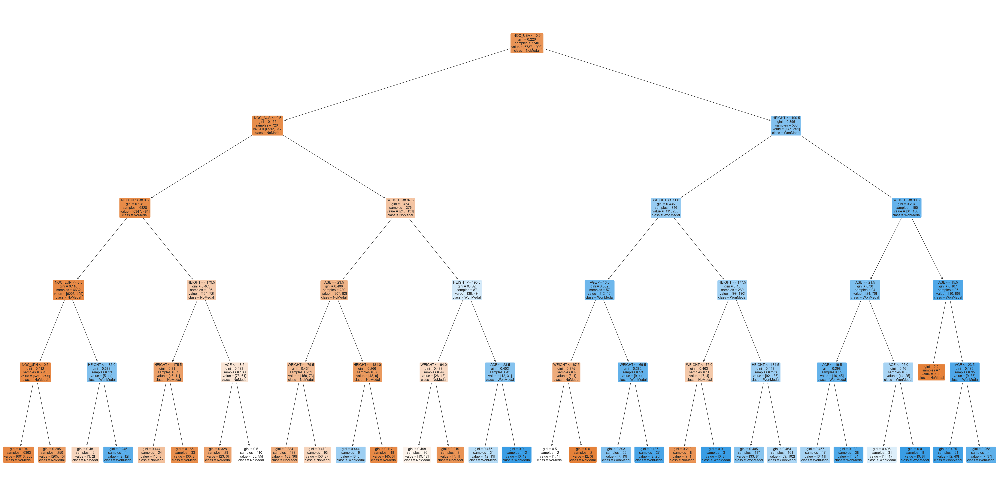

In [647]:
# Plot the trained Decision Tree
from sklearn.tree import plot_tree

f = plt.figure(figsize=(60,30))
plot_tree(dectree, filled=True, rounded=True, feature_names=list(X_train.columns), class_names=["NoMedal",'WonMedal'])
plt.savefig('dectree_athmale')

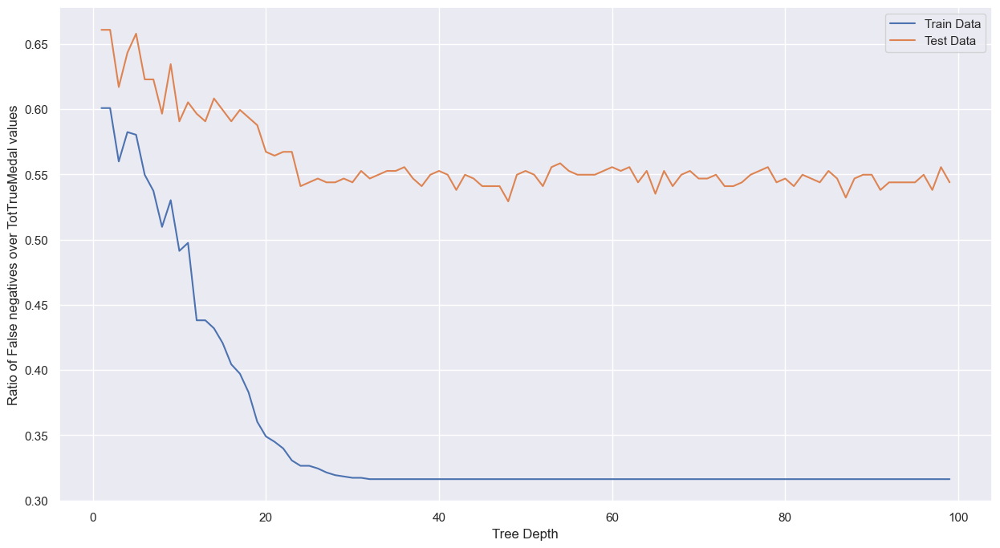

In [656]:
# Extract Response and Predictors
y = pd.DataFrame(df_wonanymedal_athmale["MEDAL"]) # Response

df_encod_catdata = pd.get_dummies(df_wonanymedal_athmale, columns=['NOC']) # Convert categorical variables to numerical using one-hot encoding
X = df_encod_catdata.drop(['NAME','SEX','TEAM','EVENT','MEDAL','SPORT',"YEAR"], axis=1)  # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

false_neg_trn=[]
false_neg_tst=[]
depth_tests= np.arange(1,100)
for each_test in depth_tests:
    dectree = DecisionTreeClassifier(max_depth = each_test)  # create the decision tree object
    dectree.fit(X_train, y_train)                    # train the decision tree model

    # Predict if Won Medal 
    y_train_pred = dectree.predict(X_train)
    y_test_pred = dectree.predict(X_test)

    cmatrix_trn=confusion_matrix(y_train, y_train_pred)
    false_neg_trn+=[cmatrix_trn[1,0]/(cmatrix_trn[1,0]+cmatrix_trn[1,1])]
    
    cmatrix_tst=confusion_matrix(y_test, y_test_pred)
    false_neg_tst+=[cmatrix_tst[1,0]/(cmatrix_tst[1,0]+cmatrix_tst[1,1])]

f = plt.figure(figsize=(15,8))
plt.plot(depth_tests,np.array(false_neg_trn ), label='Train Data')
plt.plot(depth_tests,np.array(false_neg_tst ), label='Test Data')
plt.xlabel('Tree Depth')
plt.ylabel('Ratio of False negatives over TotTrueMedal values')
plt.legend()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9518087855297158

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8798915149166989

Need to minimize false_nagatives_medals /total medal of train:  0.30730223123732253
Need to minimize false_nagatives_medals /total medal of test:  0.5825825825825826


<Axes: >

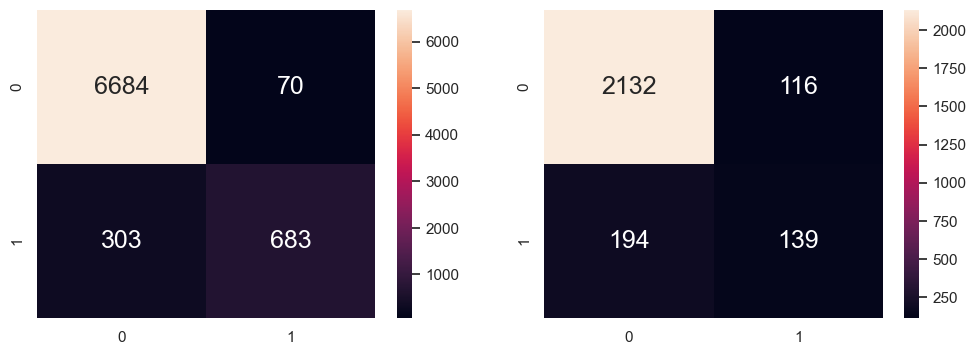

In [664]:
# Extract Response and Predictors
y = pd.DataFrame(df_wonanymedal_athmale["MEDAL"]) # Response

df_encod_catdata = pd.get_dummies(df_wonanymedal_athmale, columns=['NOC']) # Convert categorical variables to numerical using one-hot encoding
X = df_encod_catdata.drop(['NAME','SEX','TEAM', 'EVENT','MEDAL','SPORT',"YEAR"], axis=1)  # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 25)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict if Won Medal 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

cmatrix_trn=confusion_matrix(y_train, y_train_pred)
false_neg=cmatrix_trn[1,0]/(cmatrix_trn[1,0]+cmatrix_trn[1,1])
print('Need to minimize false_nagatives_medals /total medal of train: ', false_neg)

cmatrix_tst=confusion_matrix(y_test, y_test_pred)
false_neg=cmatrix_tst[1,0]/(cmatrix_tst[1,0]+cmatrix_tst[1,1])
print('Need to minimize false_nagatives_medals /total medal of test: ', false_neg)

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [668]:
test_athletes=df_wonanymedal_athmale.sample(4)
index_test_ath=test_athletes.index.tolist()
test_athletes

,NAME,SEX,AGE,HEIGHT,WEIGHT,TEAM,NOC,YEAR,SPORT,EVENT,MEDAL
ID,,,,,,,,,,,
91391,"Edward ""Eddie"" Parenti",M,25.0,180.0,79.0,Canada,CAN,1996,Swimming,Swimming Men's 4 x 100 metres Medley Relay,NoMedal
29029,Klaus Dockhorn,M,19.0,183.0,76.0,East Germany,GDR,1972,Swimming,Swimming Men's 400 metres Freestyle,NoMedal
71479,Martn Lpez-Zubero Purcell,M,23.0,188.0,78.0,Spain,ESP,1992,Swimming,Swimming Men's 200 metres Individual Medley,NoMedal
50691,Philip Hubble,M,20.0,185.0,79.0,Great Britain,GBR,1980,Swimming,Swimming Men's 200 metres Butterfly,WonMedal


In [699]:
index_test_ath=test_athletes.index.tolist()
index_test_ath

[91391, 29029, 71479, 50691]

In [701]:


df_encod_catdata = pd.get_dummies(df_wonanymedal_athmale, columns=['NOC']) # Convert categorical variables to numerical using one-hot encoding
encod_test_ath= df_encod_catdata.loc[index_test_ath]
X = encod_test_ath.drop(['NAME','SEX','TEAM', 'EVENT','MEDAL','SPORT',"YEAR"], axis=1)  # Predictor

y= dectree.predict(X)
ath_df= encod_test_ath["MEDAL"].reset_index()
y_pred = pd.DataFrame(y, columns = ["PredMedal"], index = ath_df.index)
df_acc = pd.concat([ind[["ID", "MEDAL"]], y_pred], axis = 1)
df_acc



,ID,MEDAL,PredMedal
0,91391,NoMedal,NoMedal
1,91391,NoMedal,NoMedal
2,91391,NoMedal,NoMedal
3,91391,NoMedal,NoMedal
4,91391,NoMedal,NoMedal
5,29029,NoMedal,NoMedal
6,29029,NoMedal,NoMedal
7,71479,NoMedal,NoMedal
8,71479,NoMedal,NoMedal
9,71479,NoMedal,NoMedal


In [675]:
# Extract Predictors for Prediction
X_pred = pd.DataFrame(pkmndata_pred[predictors])

# Predict Response corresponding to Predictors
y_pred = dectree.predict(X_pred)
y_pred

# Summarize the Actuals and Predictions
y_pred = pd.DataFrame(y_pred, columns = ["PredType"], index = pkmndata_pred.index)
pkmndata_acc = pd.concat([pkmndata_pred[["Name", "Type 1"]], y_pred], axis = 1)

pkmndata_acc


NameError: name 'pkmndata_pred' is not defined